**Description:** This is the Jupyter notebook is used to play a business case based King County real estate data. We want to predict the price for properties in King County Washington USA. The data was given by neuefische, but you can find it in the Kaggle Challange here: https://www.kaggle.com/harlfoxem/housesalesprediction 

**Project Name:** House price predictions King County Washington USA

**Author:** Silas Mederer

**Date:** 2020-09-04


**Tasks:** The dataset can be found in the file "King_County_House_prices_dataset.csv", in this folder.
The description of the column names can be found in the column_names.md file in this repository.
The column names are NOT clear at times. In the real world we will run into similar challenges. We would then go ask our business stakeholders for more information. In this case, let us assume our business stakeholder who would give us information, left the company. Meaning we would have to identify and look up what each column names might actually mean.
Tasks for you

Through statistical analysis/EDA, above please come up with AT LEAST 3 (you can definitely get bonus points for more than 3) recommendations for home sellers and/or buyers in King County.
Then model this dataset with a multivariate linear regression to predict the sale price of houses as accurately as possible.
Acceptable R squared values = 0.7 to 0.9
Optional:

- Split the dataset into a train and a test set.

- Use Root Mean Squared Error (RMSE) as your metric of success and try to minimize this score on your test data.

**Deliverables:** A well documented Jupyter Notebook containing any code you've written for this project and comments explaining it. This work will need to be pushed to your GitHub repository in order to submit your project. An organized README.md file in the GitHub repository that describes the contents of the repository. This file should be the source of information for navigating through the repository.

# Project 1: EDA - Kings County

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import datetime
from scipy import stats
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# Business understanding 


**Basic Input**
King County (source, wikipedia: https://en.wikipedia.org/wiki/King_County,_Washington):
population was 2,252,782 in the 2019 (Wikipedia)

Of the 789,232 households, 29.2% had children under the age of 18 living with them, 45.3% were married couples living together, 9.1% had a female householder with no husband present, 41.5% were non-families, and 31.0% of all households were made up of individuals. The average household size was 2.40 and the average family size was 3.05. The median age was 37.1 years.

The median income for a household in the county was $68,065 and the median income for a family was $87,010. Males had a median income of $62,373 versus $45,761 for females. The per capita income for the county was $38,211. About 6.4% of families and 10.2% of the population were below the poverty line, including 12.5% of those under age 18 and 8.6% of those age 65 or over.[34]


**Initial Thoughts**

Which features have the strongest impact on the price?
Based on the zipcode: Are there differences regarding the increase / decrease of prices
Think like “if you want to have features x, y, z, than look for...”

## Mining
In our case, everything was given. Read the file and see the data.

In [2]:
df = pd.read_csv("data/King_County_House_prices_dataset.csv", na_values="?")
print(type(df))
df.head()

<class 'pandas.core.frame.DataFrame'>


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
# check size, length and shape
print(f"Size:  {df.size}")
print(f"Length: {len(df)}")
print(f"Shape: {df.shape}")

Size:  453537
Length: 21597
Shape: (21597, 21)


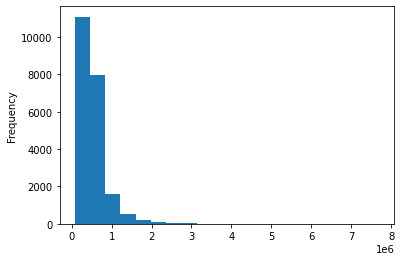

In [4]:
# check label distribution
df.price.plot(kind='hist',bins=20);

**Observation:** There is a wide span in the price. We need to keep this in mind.

In [5]:
df.describe().round()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,21597.0,21597.0,21597.0,21597.0,21597.0,21597.0,19221.0,21534.0,21597.0,21597.0,21597.0,21143.0,21597.0,17755.0,21597.0,21597.0,21597.0,21597.0,21597.0
mean,4.580474e+09,540297.0,3.0,2.0,2080.0,15099.0,1.0,0.0,0.0,3.0,8.0,1789.0,292.0,1971.0,84.0,98078.0,48.0,-122.0,1987.0,12758.0
std,2.876736e+09,367368.0,1.0,1.0,918.0,41413.0,1.0,0.0,1.0,1.0,1.0,828.0,442.0,29.0,400.0,54.0,0.0,0.0,685.0,27274.0
min,1.000102e+06,78000.0,1.0,0.0,370.0,520.0,1.0,0.0,0.0,1.0,3.0,370.0,0.0,1900.0,0.0,98001.0,47.0,-123.0,399.0,651.0
25%,2.123049e+09,322000.0,3.0,2.0,1430.0,5040.0,1.0,0.0,0.0,3.0,7.0,1190.0,0.0,1951.0,0.0,98033.0,47.0,-122.0,1490.0,5100.0
50%,3.904930e+09,450000.0,3.0,2.0,1910.0,7618.0,2.0,0.0,0.0,3.0,7.0,1560.0,0.0,1975.0,0.0,98065.0,48.0,-122.0,1840.0,7620.0
75%,7.308900e+09,645000.0,4.0,2.0,2550.0,10685.0,2.0,0.0,0.0,4.0,8.0,2210.0,560.0,1997.0,0.0,98118.0,48.0,-122.0,2360.0,10083.0
max,9.900000e+09,7700000.0,33.0,8.0,13540.0,1651359.0,4.0,1.0,4.0,5.0,13.0,9410.0,4820.0,2015.0,2015.0,98199.0,48.0,-121.0,6210.0,871200.0


**Observations:** The wide span in the price is already known. In the bathroom column there seems to be an outlier (33 bathrooms?). Also wen can see a few missings.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21143 non-null  float64
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

**Observations:** Most values are numeric, thats nice. Again wen can see a lot missings.

## Cleaning
Drop useless, deal with NaN, check for outliners

In [7]:
# drop "id" column
df.drop("id", inplace=True, axis=1)
df.head(1)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.0,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650


In [8]:
# check for missings
missing = pd.DataFrame(df.isnull().sum(),columns=['Number'])
missing['Percentage'] = round(missing.Number/df.shape[0]*100,1)
missing[missing.Number!=0]

,Number,Percentage
waterfront,2376,11.0
view,63,0.3
sqft_basement,454,2.1
yr_renovated,3842,17.8


In [9]:
# in most of the columns there are no entries, maybe because the propertie has no basement, view or renovation.
# specially the waterfront (or not) is a good indication for this. Nobody would forget this it has a high impact.
df.fillna(0, inplace=True)

In [10]:
# hopefully no negatives
print(df.min())

date             1/10/2015
price                78000
bedrooms                 1
bathrooms              0.5
sqft_living            370
sqft_lot               520
floors                   1
waterfront               0
view                     0
condition                1
grade                    3
sqft_above             370
sqft_basement            0
yr_built              1900
yr_renovated             0
zipcode              98001
lat                47.1559
long              -122.519
sqft_living15          399
sqft_lot15             651
dtype: object


In [11]:
# checking for outliners
print(df.max())

date             9/9/2014
price             7.7e+06
bedrooms               33
bathrooms               8
sqft_living         13540
sqft_lot          1651359
floors                3.5
waterfront              1
view                    4
condition               5
grade                  13
sqft_above           9410
sqft_basement        4820
yr_built             2015
yr_renovated         2015
zipcode             98199
lat               47.7776
long             -121.315
sqft_living15        6210
sqft_lot15         871200
dtype: object


In [12]:
# found bedrooms
df[df["bedrooms"] >= 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.0,11,3.00,3000,4960,2.0,0.0,0.0,3,7,2400,600.0,1918,1999.0,98106,47.5560,-122.363,1420,4960
13301,8/14/2014,1150000.0,10,5.25,4590,10920,1.0,0.0,2.0,3,9,2500,2090.0,2008,0.0,98004,47.5861,-122.113,2730,10400
15147,10/29/2014,650000.0,10,2.00,3610,11914,2.0,0.0,0.0,4,7,3010,600.0,1958,0.0,98006,47.5705,-122.175,2040,11914
15856,6/25/2014,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,5,7,1040,580.0,1947,0.0,98103,47.6878,-122.331,1330,4700
19239,12/29/2014,660000.0,10,3.00,2920,3745,2.0,0.0,0.0,4,7,1860,1060.0,1913,0.0,98105,47.6635,-122.320,1810,3745


In [13]:
# find and remove outliers outliners are "bedrooms" > 10
df.bedrooms = df.bedrooms.apply(lambda x: None if x > 10 else x)
# and the one (line 15147) with 10 to 2 bedrooms bathrooms ratio
df.bedrooms.drop([15147], axis=0)
df[df["bedrooms"] >= 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
13301,8/14/2014,1150000.0,10.0,5.25,4590,10920,1.0,0.0,2.0,3,9,2500,2090.0,2008,0.0,98004,47.5861,-122.113,2730,10400
15147,10/29/2014,650000.0,10.0,2.00,3610,11914,2.0,0.0,0.0,4,7,3010,600.0,1958,0.0,98006,47.5705,-122.175,2040,11914
19239,12/29/2014,660000.0,10.0,3.00,2920,3745,2.0,0.0,0.0,4,7,1860,1060.0,1913,0.0,98105,47.6635,-122.320,1810,3745


In [14]:
# looks great, outliners are removed
print(df.max())

date             9/9/2014
price             7.7e+06
bedrooms               10
bathrooms               8
sqft_living         13540
sqft_lot          1651359
floors                3.5
waterfront              1
view                    4
condition               5
grade                  13
sqft_above           9410
sqft_basement        4820
yr_built             2015
yr_renovated         2015
zipcode             98199
lat               47.7776
long             -121.315
sqft_living15        6210
sqft_lot15         871200
dtype: object


In [15]:
# checking data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  object 
 1   price          21597 non-null  float64
 2   bedrooms       21595 non-null  float64
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  float64
 8   view           21597 non-null  float64
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  float64
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  float64
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [16]:
# df is about one year 09.09.2014 to 01.10.2019
# dateobject to int = YYYMMDD
df["date"] = pd.to_datetime(df["date"]).dt.strftime("%y%m%d")

In [17]:
# ceck
df[200:205]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
200,150311,210000.0,3.0,1.0,860,11725,1.0,0.0,0.0,4,6,860,0.0,1943,0.0,98056,47.5093,-122.184,1300,9514
201,141112,297000.0,3.0,2.5,1940,14952,2.0,0.0,0.0,3,8,1940,0.0,1994,0.0,98042,47.3777,-122.165,2030,10450
202,140716,470000.0,3.0,1.0,1010,5000,1.0,0.0,0.0,3,7,1010,0.0,1952,0.0,98107,47.6750,-122.394,1680,5000
203,140804,226500.0,3.0,1.5,1300,7370,1.0,0.0,0.0,4,7,900,400.0,1976,0.0,98023,47.3025,-122.370,1430,7500
204,150303,274250.0,3.0,1.0,910,8450,1.0,0.0,0.0,4,6,910,0.0,1962,0.0,98059,47.4787,-122.158,1400,8040


In [18]:
# still transformation to int() needed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  object 
 1   price          21597 non-null  float64
 2   bedrooms       21595 non-null  float64
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  float64
 8   view           21597 non-null  float64
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  float64
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  float64
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [19]:
df["waterfront"] = df["waterfront"].astype(int)
df["view"] = df["view"].astype(int)
df["yr_renovated"] = df["date"].astype(int)

df["date"] = df["date"].astype(int)
df.head(1)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,141013,221900.0,3.0,1.0,1180,5650,1.0,0,0,3,7,1180,0.0,1955,141013,98178,47.5112,-122.257,1340,5650


In [20]:
# better save than sorry
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           21597 non-null  int64  
 1   price          21597 non-null  float64
 2   bedrooms       21595 non-null  float64
 3   bathrooms      21597 non-null  float64
 4   sqft_living    21597 non-null  int64  
 5   sqft_lot       21597 non-null  int64  
 6   floors         21597 non-null  float64
 7   waterfront     21597 non-null  int64  
 8   view           21597 non-null  int64  
 9   condition      21597 non-null  int64  
 10  grade          21597 non-null  int64  
 11  sqft_above     21597 non-null  int64  
 12  sqft_basement  21597 non-null  float64
 13  yr_built       21597 non-null  int64  
 14  yr_renovated   21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [21]:
# all elem in list are pot features, but "sqft_basement" has to be transformed
pot_features = list(df.columns)
pot_features

['date',
 'price',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15']

**Summary:** I handeled the missing values, the ouliers and changed the datatype of the date.

## EDA

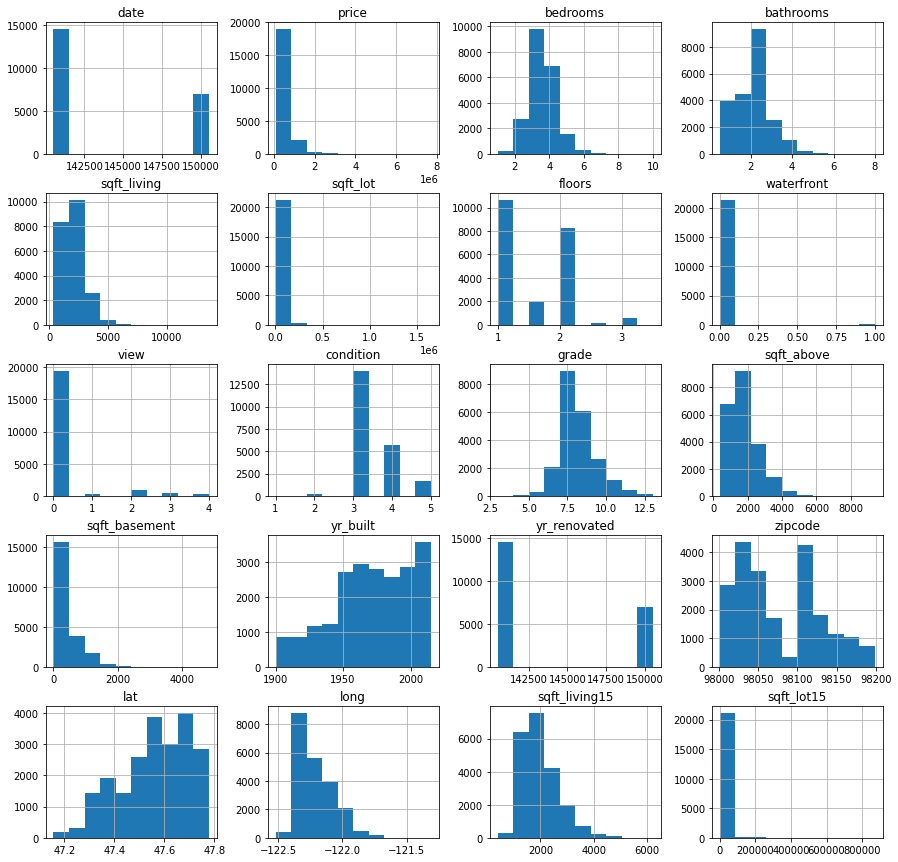

In [22]:
# visualize feature distribution
_ = df.hist(figsize=(15,15))
plt.savefig('figures/hist_all.png')

In [23]:
df.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

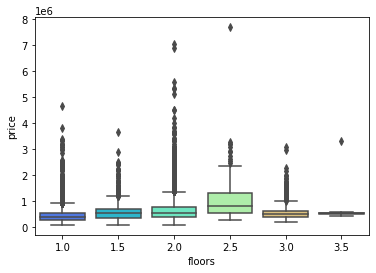

        floors
count  21597.0
mean       1.5
std        0.5
min        1.0
25%        1.0
50%        1.5
75%        2.0
max        3.5


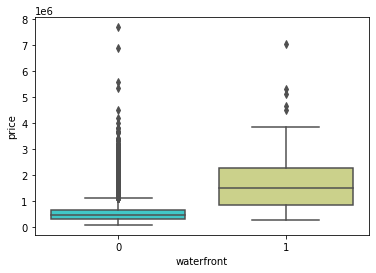

       waterfront
count     21597.0
mean          0.0
std           0.1
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           1.0


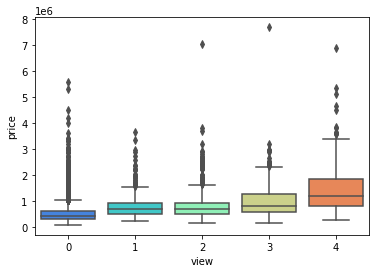

          view
count  21597.0
mean       0.2
std        0.8
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        4.0


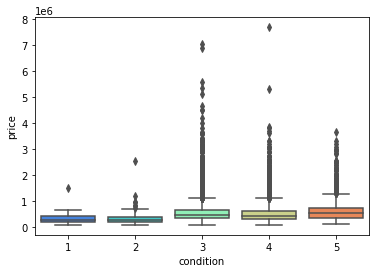

       condition
count    21597.0
mean         3.4
std          0.7
min          1.0
25%          3.0
50%          3.0
75%          4.0
max          5.0


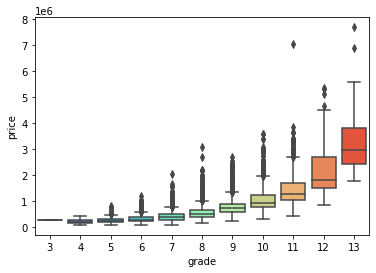

         grade
count  21597.0
mean       7.7
std        1.2
min        3.0
25%        7.0
50%        7.0
75%        8.0
max       13.0


In [24]:
boxplot_list = ['floors', 'waterfront', 'view', 'condition', 'grade']
for elem in boxplot_list:
    describe_frame = pd.DataFrame(round(df[elem].describe(),1))
    sns.boxplot(x= elem, y= "price", data = df, palette="rainbow");
    plt.show()
    plt.close()
    print(describe_frame)

## Feature engineering

In [25]:
## Price sqft_living
series_sqft_living_price = round(df["price"] / df["sqft_living"], 2)
series_sqft_living_price.name = "sqft_l_price"
print(series_sqft_living_price.head(3))
df = df.join(series_sqft_living_price)

0    188.05
1    209.34
2    233.77
Name: sqft_l_price, dtype: float64


In [26]:
# fresh new dataframs for graphics
df_less_250k = df[df["price"] < 250001]

# cool querys
df_less_500k = df.query('price >= 250000 and price <= 500000')
df_less_1mio = df.query('price >= 500000 and price <= 1000000')

# better price per sqft than mean = 264.14
df_better_pricesqft = df.query('sqft_l_price < 264.14')

### Plots

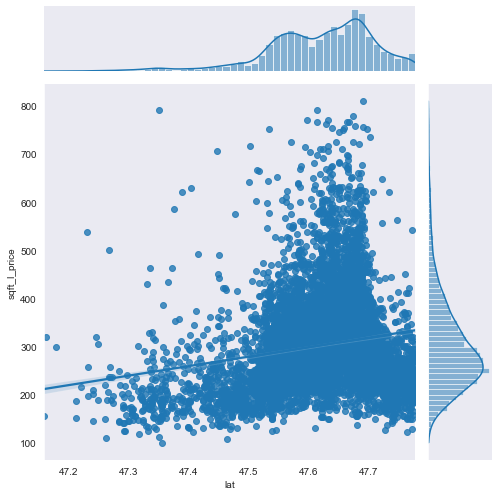

In [27]:
# upper class objects
sns.set_style(style="dark")
g = sns.jointplot(x="lat", y="sqft_l_price", data=df_less_1mio,
                  kind="reg", truncate=True,
                  height=7)
plt.savefig('figures/jointplot-sqft_above-price_less_500k.png')

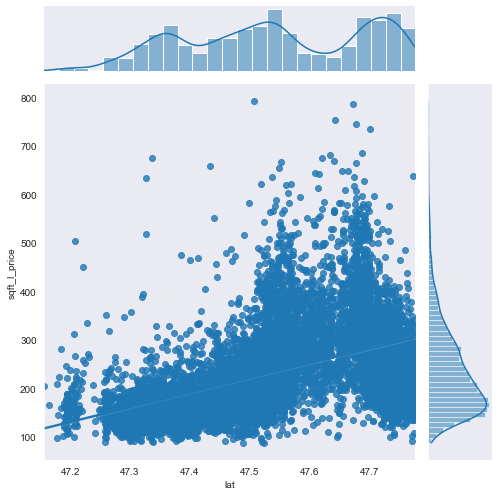

In [28]:
# upper middle class objects
g = sns.jointplot(x="lat", y="sqft_l_price", data=df_less_500k,
                  kind="reg", truncate=True,
                  height=7)
plt.savefig('figures/jointplot-sqft_above-price_less_500k.png')

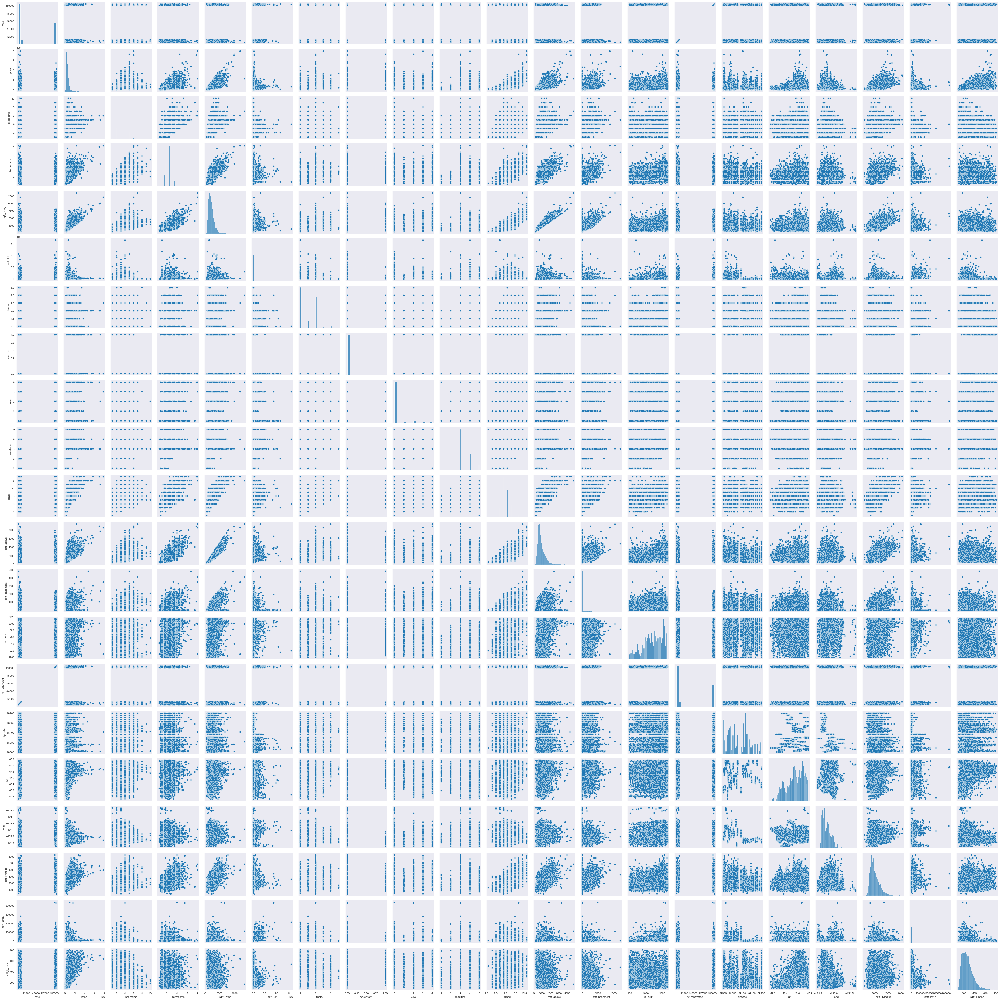

In [29]:
# start with a pairplot
sns.pairplot(df)
plt.savefig('figures/pairplot.png')

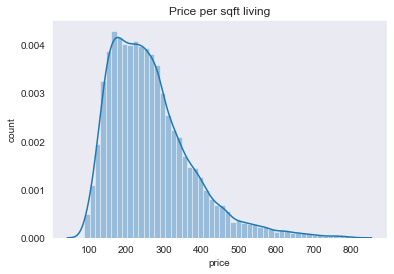

In [31]:
sns.distplot(df["sqft_l_price"])
plt.title("Price per sqft living")
plt.xlabel("price")
plt.ylabel("count")
plt.savefig('figures/dist-prics_sqft.png')

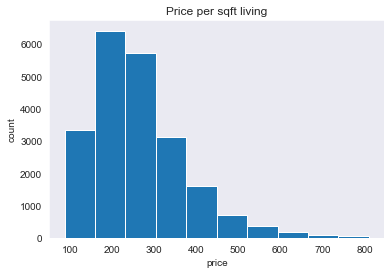

In [32]:
plt.hist(df["sqft_l_price"])
plt.title("Price per sqft living")
plt.xlabel("price")
plt.ylabel("count")
plt.savefig('figures/hist-price_sqft.png')
plt.show()

**Sumary:** All data is now clean and ready to be processed in a linear regression.

## Maps

In [33]:
import plotly.express as px
fig = px.density_mapbox(df, lat='lat', lon='long', z='price', radius=4,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.5, opacity=1,
                        title="Real Estate Regional Density Map",
                        mapbox_style="open-street-map")
fig.show()

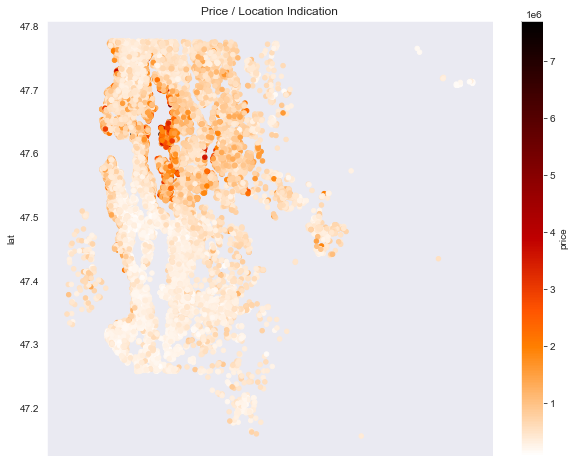

In [34]:
df.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price / Location Indication");
plt.savefig('figures/cluster-scatter.png')
plt.show()

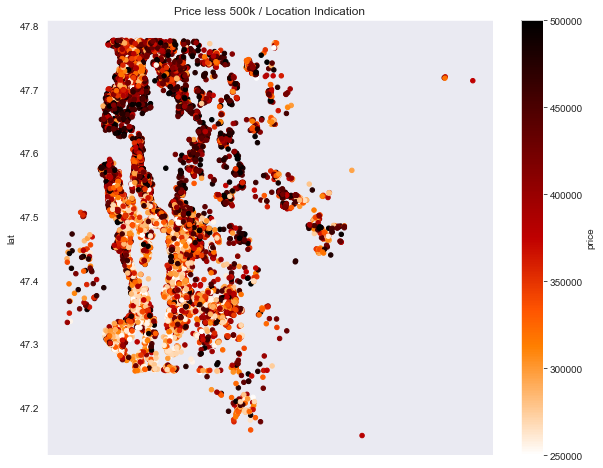

In [35]:
df_less_500k.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price less 500k / Location Indication");
plt.savefig('figures/cluster-scatter-less500k.png')
plt.show()

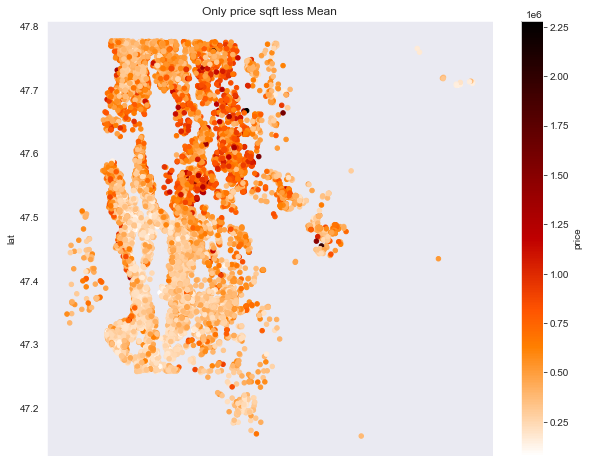

In [36]:
df_better_pricesqft.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Only price sqft less Mean");
plt.savefig('figures/cluster-price_sqft_mean.png')
plt.show()

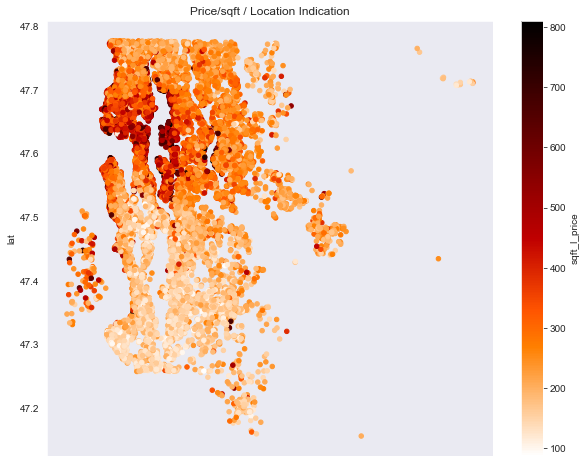

In [37]:
df.plot(kind="scatter", x="long", c="sqft_l_price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price/sqft / Location Indication");
plt.savefig('figures/cluster-price_sqft.png')
plt.show()

## Correlation analysis

In [38]:
continuous_var = ['date',
                  'price',
                  'sqft_living',
                  'sqft_lot',
                  'sqft_above',
                  'sqft_basement',
                  'yr_built',
                  'yr_renovated',
                  'lat',
                  'long',
                  'sqft_living15',
                  'sqft_lot15',
                  "sqft_l_price"]

In [39]:
categorical_var = ["waterfront",
                   "condition",
                   "grade",
                   'floors',
                   'view',
                   'bedrooms',
                   'bathrooms',
                   "zipcode"]

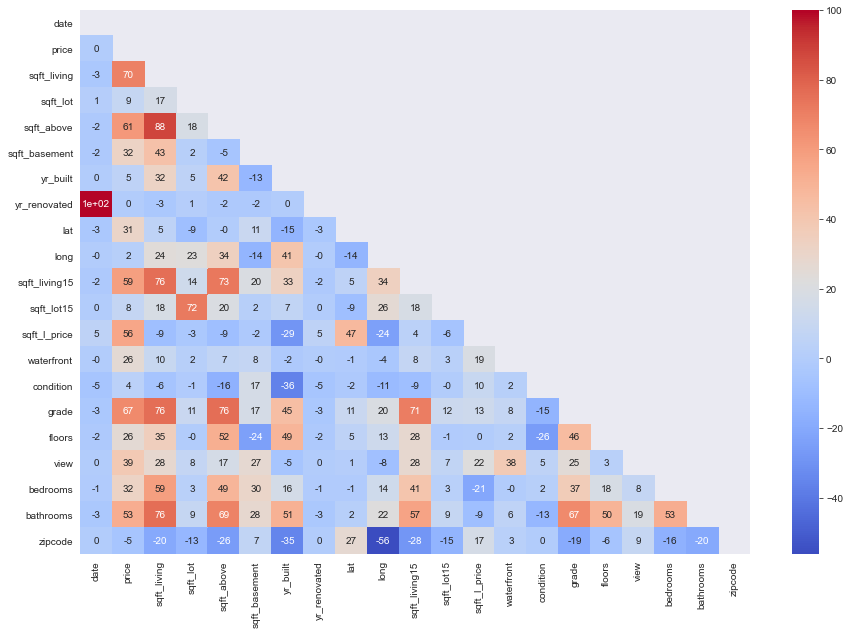

In [40]:
fig, ax = plt.subplots(figsize=(15,10))


df_dum = pd.get_dummies(df[continuous_var+categorical_var].copy())
mask = np.triu(df_dum.corr())
ax = sns.heatmap(round(df_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap="coolwarm")
                 
plt.savefig('figures/correlogram.png')

## Export

In [41]:
df.to_csv("data/df_clean.csv")